# Prueba Claro
## Frank Montenegro - frandak2@gmail.com

### importamos las librerias que vamos a usar

In [1]:
import pandas as pd
import geopandas as gpd
import libpysal as lp
import matplotlib.pyplot as plt
import seaborn as sns
import geoplot as gplt
import geoplot.crs as gcrs
import plotly.express as px
import rasterio as rio
import numpy as np
import contextily as ctx
import shapely.geometry as geom
import folium
import folium.plugins as plugins
import os
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')# Configuración warnings

### redireccionamos la ruta del notebook

In [2]:
# import os
g = os.getcwd()
g
path = r'D:\repos\GEO_CLARO'
os.chdir(path)

## Procedemos a leer los archivos shapefile
de antemanos sabemos que el shape MGN es la capa de centros poblados del igac, en este shape tenemos imforacion sobre la forma, tamanio y area de cada centro poblado del pais

In [3]:
points_late = gpd.read_file('data/points_ok/late_bgt.shp')
points_late.head(5)


,FECHA,TEST_ID,N_OPERADOR,DOWNLOAD_M,UPLOAD_MBP,CLASS_LATE,localidad,geometry
0,2021-01-28,6978771403,4,10.410156,0.640625,0,ANTONIO NARIÑO,POINT (-74.09600 4.58700)
1,2021-01-19,6945885369,4,10.294922,4.988281,0,ANTONIO NARIÑO,POINT (-74.12100 4.59200)
2,2021-01-08,6907797685,4,28.707031,4.711914,0,ANTONIO NARIÑO,POINT (-74.10000 4.59000)
3,2021-01-21,6953823661,4,53.502930,7.201172,0,ANTONIO NARIÑO,POINT (-74.09500 4.58500)
4,2021-01-21,6952553476,4,26.608398,6.316406,0,ANTONIO NARIÑO,POINT (-74.12100 4.59300)


## Que podemos averiguar con este dataset
### - crear un mapa del total de comparendos mensuales por localidad?
### - crear un densidad de comparendos anual?

In [4]:
points_late['FECHA'] = pd.to_datetime(points_late['FECHA'])## transformamos la columna fecha
points_late.head(5)

,FECHA,TEST_ID,N_OPERADOR,DOWNLOAD_M,UPLOAD_MBP,CLASS_LATE,localidad,geometry
0,2021-01-28,6978771403,4,10.410156,0.640625,0,ANTONIO NARIÑO,POINT (-74.09600 4.58700)
1,2021-01-19,6945885369,4,10.294922,4.988281,0,ANTONIO NARIÑO,POINT (-74.12100 4.59200)
2,2021-01-08,6907797685,4,28.707031,4.711914,0,ANTONIO NARIÑO,POINT (-74.10000 4.59000)
3,2021-01-21,6953823661,4,53.502930,7.201172,0,ANTONIO NARIÑO,POINT (-74.09500 4.58500)
4,2021-01-21,6952553476,4,26.608398,6.316406,0,ANTONIO NARIÑO,POINT (-74.12100 4.59300)


In [5]:
#sacamos la informacion por mes
points_late['MES'] = pd.DatetimeIndex(points_late['FECHA']).month_name()
points_late['MES'] = pd.Categorical(points_late['MES'], categories=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September'], ordered=True)
OP3 = points_late[points_late['N_OPERADOR']==3][['FECHA','CLASS_LATE','MES','geometry']]
OP3['CANTIDAD'] = 1
OP3['LON']=pd.Series(OP3['geometry'].apply(lambda p: p.x))
OP3['LAT']=pd.Series(OP3['geometry'].apply(lambda p: p.y))



## Crearemos un hotplot mensual para el operador 3 y de esta forma tener un analisis por operador.

In [6]:
token = 'pk.eyJ1IjoiZnJhbmRhazIiLCJhIjoiY2t0cHpubW1jMDlmdzJvbXhjZ2o0eHc0ZiJ9.WiHLSWVwG9VYcmBLls4oDg' ## token para usar plotly
px.set_mapbox_access_token(token)#acceder con token

In [7]:
## acomodamos los datos segun las necesidades de la funciones de folium, ya que recibe una lista de cordenadas por fecha
fecha = OP3[['LAT','LON','CANTIDAD','FECHA']]
fecha = fecha.groupby('FECHA')
array=[]
time_index=[]
for key, group in fecha:
    time_index.append(str(key))
    array.append(np.array(group[['LAT','LON','CANTIDAD']]))
array = [i.tolist() for i in array]

In [8]:
## creamos un mapa con folium que sea dinamico para ver el hotsplot por dia de nuestros datos.
m = folium.Map([4.6, -74.0], tiles="stamentoner", zoom_start=12)# mapa base

hm = plugins.HeatMapWithTime(array, index=time_index, auto_play=True, max_opacity=0.3) #heatmap diario y con auto play

hm.add_to(m)# lo agregamos al mapa base

m # lo publicamos o mostramos

## estos mapas son dinamicos y nos ayudan a mostrar de forma rapida que puede suceder con nuestros datos, pero que ocurre cuand deseamos operar con esta informacion? pues para eso tenemos muchas herramientas como usar OGR, GDAL o QGIS puro para crear esto mapas de calor o densidad

<AxesSubplot:>

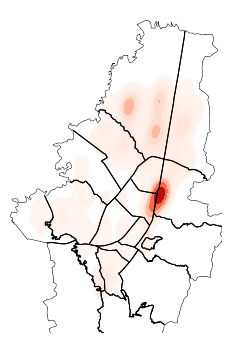

In [9]:
import geoplot as gplt
import geoplot.crs as gcrs

localidades = gpd.read_file('data\localidades\localidades_data.shp') #leemos el shape de localiades enriquecido

# creamos un heatmap dede geoplot
OP3_J = OP3[OP3['MES']=='January']

ax = gplt.polyplot(localidades,zorder=1)
gplt.kdeplot(OP3_J, cmap='Reds',shade=True, clip=localidades, ax=ax)


<AxesSubplot:>

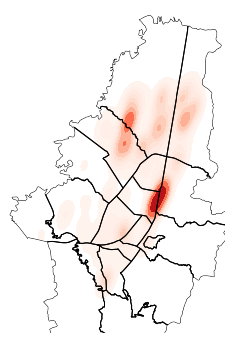

In [10]:
# creamos un heatmap dede geoplot
OP3_S = OP3[OP3['MES']=='September']

ax = gplt.polyplot(localidades,zorder=1)
gplt.kdeplot(OP3_S, cmap='Reds',shade=True, clip=localidades, ax=ax)

## con estos mapas podriamos hacer diversas operaciones como sumarlos para ver frecuencias en el tiempo todo esto lo podemos hacer a una escla diaria, semana, mensual.

# ahora hallaremos los cluster a nivel mensual, utilizando Kmeans, nos ayudara a clasificar cada punto dentro un grupo para ver si hay patrones espaciales

In [11]:
MES = OP3[['MES','LON', 'LAT', 'geometry']]
MES = MES.groupby('MES')
for key, group in MES:
    gdf = MES.get_group(key)
    gdf['MES'] = gdf['MES'].astype(str) 
    a=pd.Series(gdf['LON'])
    b=pd.Series(gdf['LAT'])
    X=np.column_stack((a,b))
OP3.head(5)

,FECHA,CLASS_LATE,MES,geometry,CANTIDAD,LON,LAT
2068,2021-01-21,0,January,POINT (-74.10200 4.59200),1,-74.10200,4.59200
2069,2021-02-07,0,February,POINT (-74.09888 4.58080),1,-74.09888,4.58080
2070,2021-02-07,0,February,POINT (-74.09889 4.58075),1,-74.09889,4.58075
2071,2021-02-04,0,February,POINT (-74.09890 4.58072),1,-74.09890,4.58072
2072,2021-02-05,0,February,POINT (-74.09865 4.58082),1,-74.09865,4.58082


In [12]:
X

array([[-74.098,   4.592],
       [-74.094,   4.589],
       [-74.094,   4.593],
       ...,
       [-74.039,   4.725],
       [-74.039,   4.725],
       [-74.039,   4.725]])

### Usaré el método del ELBOW para determinar el número óptimo de grupos.

In [13]:
from sklearn.cluster import MiniBatchKMeans as KMeans
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

def train_elbow_cluster(train,start=1,finish=10,each=1):
    wcss = {} #dicionario vacio para guardar los errores
    train = scaler.fit_transform(train)
    for i in range(start,finish,each):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(train)
        wcss[i] = kmeans.inertia_ #suma de distancias cuadradas a los centros del grupos más cercanos
    plt.title('Metodo de Elbow ')
    plt.xlabel('k= n grupos')
    plt.ylabel('WCSS')
    sns.pointplot(x=list(wcss.keys()), y=list(wcss.values()))
    plt.show()
    return wcss

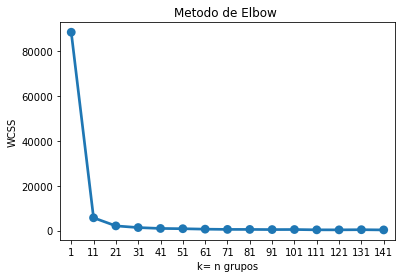

{1: 88405.62931984814,
 11: 5695.413988866179,
 21: 2085.3595135536107,
 31: 1340.835184920346,
 41: 941.087596028284,
 51: 826.6079803455949,
 61: 626.1567743667463,
 71: 518.1498265450501,
 81: 508.4799315209865,
 91: 442.9946824189601,
 101: 465.98981275265385,
 111: 332.0095634730592,
 121: 321.0042160184259,
 131: 389.30809952244874,
 141: 290.9697709241381}

In [14]:
train_elbow_cluster(X,finish=150,each=10)

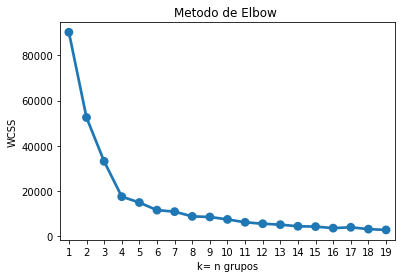

{1: 90227.04206798342,
 2: 52479.08456226006,
 3: 33051.75894019381,
 4: 17419.321418686104,
 5: 14821.24250145048,
 6: 11449.451611247408,
 7: 10783.110284358494,
 8: 8675.147416981168,
 9: 8432.834281278883,
 10: 7343.653444691406,
 11: 6066.826485932875,
 12: 5426.048165769307,
 13: 5025.335847984384,
 14: 4303.0931026706785,
 15: 4162.092746454154,
 16: 3482.384474462585,
 17: 3857.5928249627023,
 18: 3039.3769389585327,
 19: 2690.80438388283}

In [32]:
train_elbow_cluster(X,finish=20,each=1)

In [15]:
kmeans = KMeans(n_clusters = 16, init = 'k-means++', random_state = 42,  max_iter=400)
X_t = scaler.fit_transform(X)
y_kmeans = kmeans.fit_predict(X_t)
gdf['cluster_Kmeans']=y_kmeans

Text(0.5, 1.0, 'cluster del mes')

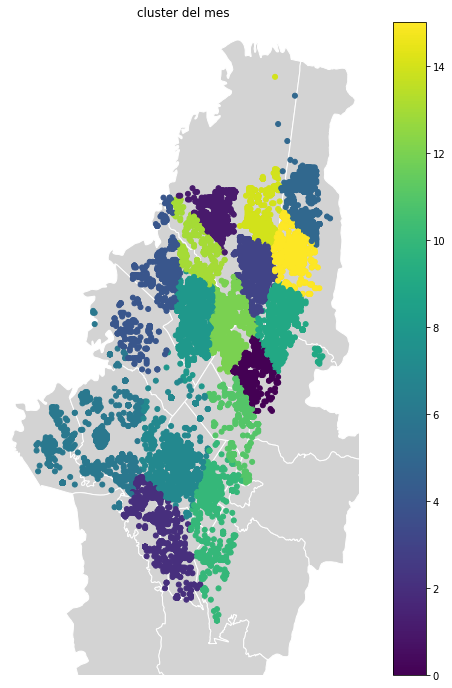

In [16]:
gdf.to_crs(epsg=4326, inplace=True)

ax = gplt.polyplot(
    localidades,
    zorder=-1,
    linewidth=1,
    projection=gcrs.Mollweide(),
    edgecolor='white',
    facecolor='lightgray',
    figsize=(12, 12)
)
gplt.pointplot(
    gdf,
    hue='cluster_Kmeans',
    legend=True, legend_var='hue',
    ax=ax
)

plt.title("cluster del mes")

In [17]:
gdf.head(5)

,MES,LON,LAT,geometry,cluster_Kmeans
11848,September,-74.098,4.592,POINT (-74.09800 4.59200),10
11929,September,-74.094,4.589,POINT (-74.09400 4.58900),10
11930,September,-74.094,4.593,POINT (-74.09400 4.59300),10
11931,September,-74.090,4.592,POINT (-74.09000 4.59200),10
11933,September,-74.094,4.589,POINT (-74.09400 4.58900),10


In [45]:
from shapely.geometry import MultiPoint
groups = gdf.groupby('cluster_Kmeans')
poly = gpd.GeoDataFrame()
for name,group in groups:
    df = groups.get_group(name)
    multi = []
    for a,b in zip(df['LON'],df['LAT']):
        multi.append((a,b))
    geometry = gpd.GeoSeries([MultiPoint(multi)]).convex_hull
    p = gpd.GeoDataFrame({ 'N_cluster': name,'N_points': df.shape[0], 'geometry':geometry})
    poly = poly.append(p)

In [46]:
gpd.GeoDataFrame({ 'N_cluster': name,'N_points': df.shape[0], 'geometry':geometry})
poly

,N_cluster,N_points,geometry
0,0,5550,"POLYGON ((-74.06400 4.64000, -74.06700 4.64400..."
0,1,1629,"POLYGON ((-74.08400 4.72400, -74.09600 4.73600..."
0,2,1780,"POLYGON ((-74.10900 4.54000, -74.11600 4.54100..."
0,3,2783,"POLYGON ((-74.06300 4.68800, -74.06700 4.69300..."
0,4,1028,"POLYGON ((-74.13400 4.66100, -74.13800 4.66200..."
0,5,2567,"POLYGON ((-74.02400 4.72800, -74.02900 4.73100..."
0,6,1281,"POLYGON ((-74.15600 4.58900, -74.20600 4.60800..."
0,7,3070,"POLYGON ((-74.10900 4.58400, -74.12100 4.59300..."
0,8,3994,"POLYGON ((-74.09900 4.65300, -74.11000 4.65600..."
0,9,1746,"POLYGON ((-74.04900 4.66100, -74.05100 4.66300..."


In [47]:
import libpysal as lp
w = lp.weights.Queen.from_dataframe(poly)### Calculo matrix de pesos usan la configuracion tipo reina, aqui calcula los pesos en todas las direcciones
w.transform = 'R' #standarizacion de la matriz de pesos

('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 2, ' is an island (no neighbors)')
('WARNING: ', 3, ' is an island (no neighbors)')
('WARNING: ', 4, ' is an island (no neighbors)')
('WARNING: ', 5, ' is an island (no neighbors)')
('WARNING: ', 6, ' is an island (no neighbors)')
('WARNING: ', 7, ' is an island (no neighbors)')
('WARNING: ', 8, ' is an island (no neighbors)')
('WARNING: ', 9, ' is an island (no neighbors)')
('WARNING: ', 10, ' is an island (no neighbors)')
('WARNING: ', 11, ' is an island (no neighbors)')
('WARNING: ', 12, ' is an island (no neighbors)')
('WARNING: ', 13, ' is an island (no neighbors)')
('WARNING: ', 14, ' is an island (no neighbors)')
('WARNING: ', 15, ' is an island (no neighbors)')


In [48]:
from splot.esda import moran_scatterplot
from esda.moran import Moran_Local
y = poly.N_points.values
moran_loc = Moran_Local(y, w )
fig, ax = moran_scatterplot(moran_loc,p = 0.05)
plt.show()

ValueError: cannot assign slice from input of different size

# este mapa nos muestra que el operador 3 en septiembre tiene al rededor de 16 clusters. Todos estos analisis son replicaples para cada operdor, mes, dia y para diferentes escalas espaciales.

In [56]:
from sklearn.cluster import DBSCAN 
# Define DBSCAN
clusterDB = DBSCAN(eps=1/6371, min_samples=5, algorithm='ball_tree', metric='haversine')
# Fit to our data
clusterDB = clusterDB.fit(np.radians(X_t))
gdf['cluster_DBscan']=clusterDB.labels_


Text(0.5, 1.0, 'cluster del mes')

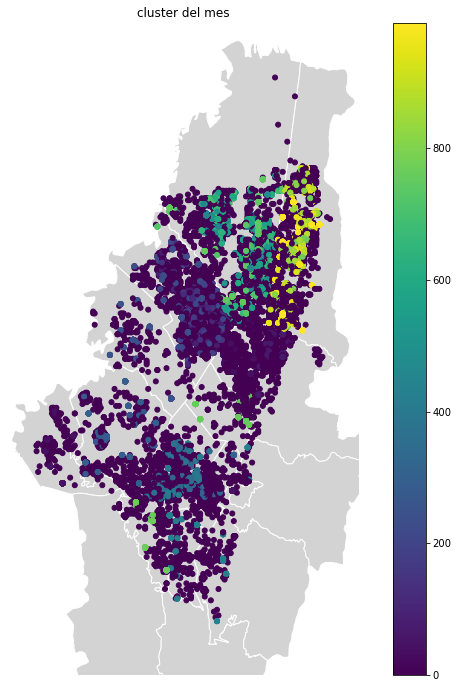

In [57]:
ax = gplt.polyplot(
    localidades,
    zorder=-1,
    linewidth=1,
    projection=gcrs.Mollweide(),
    edgecolor='white',
    facecolor='lightgray',
    figsize=(12, 12)
)
gplt.pointplot(
    gdf,
    hue='cluster_DBscan',
    legend=True, legend_var='hue',
    ax=ax
)

plt.title("cluster del mes")